## Multi-Bar Classification

Description:
Here, we classify whether price will move up, down, or remain neutral over a fixed horizon (e.g., 5 bars). We label each bar with −1,0,+1 based on future returns exceeding positive/negative thresholds. A classifier (e.g., RandomForestClassifier) then learns to predict these discrete classes, which we translate into trading signals.

#### 📌 Important Note:
This notebook contains *interactive charts generated using Vectorbt.  
GitHub does not display interactive Plotly charts, so the graphs will not be visible here.  

✅ To view the charts, please download this notebook and run it on your local machine.  
Make sure you have Vectorbt and its dependencies installed to regenerate the visualizations.


## Part 1: Data & Feature Engineering

**Objective:**  
Load raw price data (MetaTrader 5 or CSV) and transform it into a feature-rich dataset.

**Tasks:**
- Fetch historical bars  
- Apply `ta.add_all_ta_features` or custom features  
- (Optionally) create specific labels (multi-bar, double-barrier, regime, etc.)  
- Clean/prepare the final feature matrix **X** and target **y**  



🔵 Processing Symbol: US500
⚡ Training RandomForestClassifier...
⚡ Training GradientBoostingClassifier...
⚡ Training SVC...
⚡ Training XGBClassifier...
⚡ Training LGBMClassifier...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011184 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 20939
[LightGBM] [Info] Number of data points in the train set: 9995, number of used features: 92
[LightGBM] [Info] Start training from score -2.577838
[LightGBM] [Info] Start training from score -0.160961
[LightGBM] [Info] Start training from score -2.620914


  File "c:\Users\moham\miniconda3\envs\ml\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
               ^^^^^^^^^^^^^^^
  File "c:\Users\moham\miniconda3\envs\ml\Lib\subprocess.py", line 548, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\moham\miniconda3\envs\ml\Lib\subprocess.py", line 1026, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "c:\Users\moham\miniconda3\envs\ml\Lib\subprocess.py", line 1538, in _execute_child
    hp, ht, pid, tid = _winapi.CreateProcess(executable, args,
                       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


⚡ Training GaussianNB...
⚡ Training BernoulliNB...
🏆 Best Model for US500: RandomForestClassifier with Sharpe 6.45


🔵 Processing Symbol: US2000
⚡ Training RandomForestClassifier...
⚡ Training GradientBoostingClassifier...
⚡ Training SVC...
⚡ Training XGBClassifier...
⚡ Training LGBMClassifier...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020595 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21042
[LightGBM] [Info] Number of data points in the train set: 9995, number of used features: 92
[LightGBM] [Info] Start training from score -1.994600
[LightGBM] [Info] Start training from score -0.322049
[LightGBM] [Info] Start training from score -1.971343
⚡ Training GaussianNB...
⚡ Training BernoulliNB...
🏆 Best Model for US2000: RandomForestClassifier with Sharpe 8.03


🔵 Processing Symbol: UK100
⚡ Training RandomForestClassifier...
⚡ Training GradientBoostingClassifier...
⚡ Training SVC...
⚡ Training

,Symbol,Model,Accuracy,Return(%),Sharpe,FittedModel,Scaler
35,DE40,RandomForestClassifier,1.000,8.309,7.005,"(DecisionTreeClassifier(max_features='sqrt', r...",StandardScaler()
39,DE40,LGBMClassifier,0.988,7.405,6.658,LGBMClassifier(random_state=42),StandardScaler()
38,DE40,XGBClassifier,0.952,5.274,5.681,"XGBClassifier(base_score=None, booster=None, c...",StandardScaler()
36,DE40,GradientBoostingClassifier,0.924,3.930,4.841,([DecisionTreeRegressor(criterion='friedman_ms...,StandardScaler()
37,DE40,SVC,0.856,0.577,1.752,SVC(probability=True),StandardScaler()
40,DE40,GaussianNB,0.760,0.528,1.257,GaussianNB(),StandardScaler()
41,DE40,BernoulliNB,0.573,0.008,0.064,BernoulliNB(),StandardScaler()
21,JP225,RandomForestClassifier,1.000,59.556,8.829,"(DecisionTreeClassifier(max_features='sqrt', r...",StandardScaler()
25,JP225,LGBMClassifier,0.912,25.497,6.905,LGBMClassifier(random_state=42),StandardScaler()
24,JP225,XGBClassifier,0.853,12.621,5.383,"XGBClassifier(base_score=None, booster=None, c...",StandardScaler()


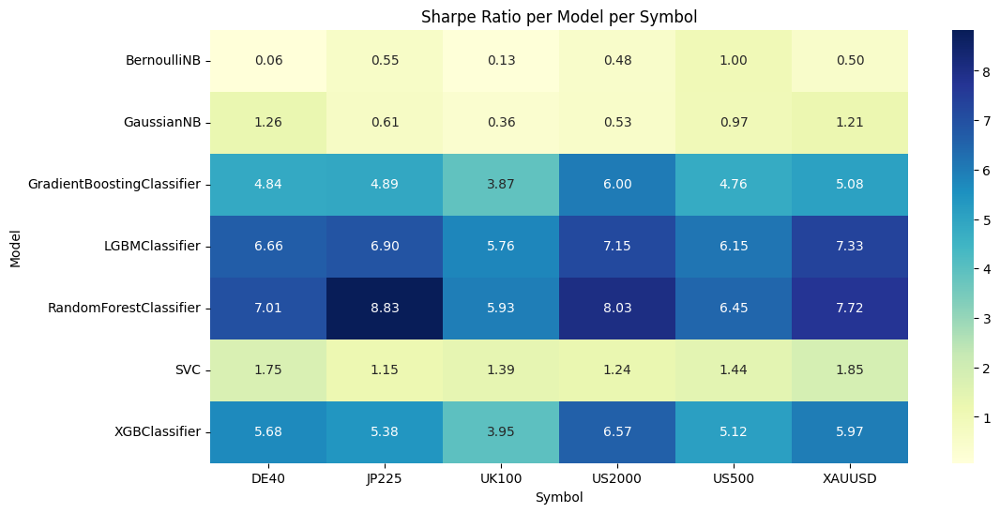

In [1]:
# ----------------------------------------------------------------------------
# 0) SETUP
# ----------------------------------------------------------------------------
import sys
import os
import warnings
from pathlib import Path

project_root = Path.cwd().parent.parent
sys.path.append(str(project_root))
os.chdir(str(project_root))
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import MetaTrader5 as mt5
import vectorbt as vbt
import seaborn as sns
import matplotlib.pyplot as plt
import joblib

from data.data_loader_mt5 import get_data_mt5
from features.feature_engineering import add_all_ta_features
from features.labeling_schemes import create_labels_multi_bar
from backtests.simple_backtest import simulate_trading, calculate_sharpe_ratio

from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.naive_bayes import GaussianNB, BernoulliNB
from sklearn.metrics import accuracy_score

# ----------------------------------------------------------------------------
# 1) LIST OF SYMBOLS
# ----------------------------------------------------------------------------
# symbols = ["EURUSD", "USDJPY", "AUDUSD", "GBPUSD", "USDCHF", "EURGBP", "MSFT.NAS", "TSLA.NAS", "NVDA.NAS", "AMZN.NAS", "GOOG.NAS", "NFLX.NAS","AAPL.NAS", 
#            "BABA.NYSE", "JPM.NYSE", "XOM.NYSE", "BA.NYSE", "DIS.NYSE", "NKE.NYSE"]


symbols = ["US500", "US2000", "UK100", "JP225", "XAUUSD", "DE40"]
timeframe = mt5.TIMEFRAME_H1
n_bars = 10000
start_pos = 0
horizon = 5
threshold = 0.005

# ----------------------------------------------------------------------------
# 2) BACKTESTING MULTIPLE SYMBOLS
# ----------------------------------------------------------------------------
if not mt5.initialize():
    raise RuntimeError("Failed to initialize MT5")

# Prepare folders
model_folder = "models/h1_models"
os.makedirs(model_folder, exist_ok=True)

all_results = []
best_models = {}  # store best model per symbol

for symbol in symbols:
    print(f"\n\n🔵 Processing Symbol: {symbol}")

    data = get_data_mt5(symbol=symbol, timeframe=timeframe, n_bars=n_bars, start_pos=start_pos)
    if data is None or len(data) == 0:
        print(f"⚠️ No data for {symbol}, skipping...")
        continue

    df = add_all_ta_features(data)
    df_lbl = create_labels_multi_bar(df, horizon=horizon, threshold=threshold)

    X = df_lbl.drop(columns=["multi_bar_label", "future_return_h"])
    y = df_lbl["multi_bar_label"]

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    models = {
        "RandomForestClassifier": RandomForestClassifier(n_estimators=100, random_state=42),
        "GradientBoostingClassifier": GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42),
        "SVC": SVC(C=1.0, kernel='rbf', probability=True),
        "XGBClassifier": XGBClassifier(n_estimators=100, learning_rate=0.1, random_state=42),
        "LGBMClassifier": LGBMClassifier(n_estimators=100, learning_rate=0.1, random_state=42),
        "GaussianNB": GaussianNB(),
        "BernoulliNB": BernoulliNB()
    }

    symbol_model_results = []

    for model_name, model in models.items():
        print(f"⚡ Training {model_name}...")

        model.fit(X_scaled, y + 1)

        preds_shifted = model.predict(X_scaled)
        preds = preds_shifted - 1

        acc = accuracy_score(y, preds)

        signals = preds
        close_prices = df_lbl["close"]
        signals_s = pd.Series(signals, index=close_prices.index)

        pf = vbt.Portfolio.from_signals(
            close_prices,
            entries=signals_s > 0,
            exits=signals_s < 0,
            init_cash=10000,
            freq='4H',
            fees=0.0002
        )

        total_return = pf.total_return()
        sharpe = pf.sharpe_ratio()

        symbol_model_results.append({
            "Symbol": symbol,
            "Model": model_name,
            "Accuracy": acc,
            "Return(%)": total_return,
            "Sharpe": sharpe,
            "FittedModel": model,
            "Scaler": scaler  # keep scaler too
        })

    # Find best model by Sharpe for this symbol
    best_model_info = max(symbol_model_results, key=lambda x: x["Sharpe"])
    best_models[symbol] = best_model_info

    print(f"🏆 Best Model for {symbol}: {best_model_info['Model']} with Sharpe {best_model_info['Sharpe']:.2f}")

    all_results.extend(symbol_model_results)

mt5.shutdown()

# ----------------------------------------------------------------------------
# 3) SAVE BEST MODELS
# ----------------------------------------------------------------------------
# Map timeframe integer to readable string
timeframe_mapping = {
    mt5.TIMEFRAME_M1: "M1",
    mt5.TIMEFRAME_M5: "M5",
    mt5.TIMEFRAME_M15: "M15",
    mt5.TIMEFRAME_M30: "M30",
    mt5.TIMEFRAME_H1: "H1",
    mt5.TIMEFRAME_H4: "H4",
    mt5.TIMEFRAME_D1: "D1",
}
timeframe_str = timeframe_mapping.get(timeframe, str(timeframe))  # fallback if not mapped

for symbol, info in best_models.items():
    save_path_model = f"{model_folder}/{symbol}_{timeframe_str}_best_model.pkl"
    joblib.dump({
        "model": info["FittedModel"],
        "scaler": info["Scaler"]
    }, save_path_model)
    print(f"✅ Saved best model for {symbol} ({timeframe_str}) to {save_path_model}")


# ----------------------------------------------------------------------------
# 4) SUMMARY
# ----------------------------------------------------------------------------
summary_df = pd.DataFrame(all_results)
summary_df = summary_df.sort_values(by=["Symbol", "Sharpe"], ascending=[True, False])

print("\n\n✅ Summary Results Across Symbols:")
display(summary_df.round(3))

# ----------------------------------------------------------------------------
# 5) HEATMAP
# ----------------------------------------------------------------------------
pivot_df = summary_df.pivot(index="Model", columns="Symbol", values="Sharpe")

plt.figure(figsize=(12,6))
sns.heatmap(pivot_df, annot=True, fmt=".2f", cmap="YlGnBu")
plt.title("Sharpe Ratio per Model per Symbol")
plt.show()


## Part 2: Backtesting & Performance Evaluation

**Objective:**  
Evaluate how well the trained model performs on unseen data, simulating real trades.

**Tasks:**
- Use walk-forward or expanding splits to mimic “live” conditions  
- Convert model predictions to signals ([-1, 0, +1] or buy/sell/hold)  
- Run a simple backtest script or VectorBT for performance metrics  
- Calculate returns, Sharpe ratio, drawdowns, confusion matrix, etc.  
- Visualize results (equity curve, trades, etc.) to judge strategy viability  



🔵 Backtesting Symbol: US500

✅ Full Backtest Results:
Accuracy=0.98, Return=2.71%, Sharpe=6.51
Start                               2024-06-25 23:00:00
End                                 2025-05-01 02:00:00
Period                                832 days 12:00:00
Start Value                                     10000.0
End Value                                  37146.284683
Total Return [%]                             271.462847
Benchmark Return [%]                           2.520776
Max Gross Exposure [%]                            100.0
Total Fees Paid                               638.40476
Max Drawdown [%]                               2.021725
Max Drawdown Duration                  38 days 08:00:00
Total Trades                                         82
Total Closed Trades                                  81
Total Open Trades                                     1
Open Trade PnL                               804.630346
Win Rate [%]                                  97.530864
Best Tr


📈 Plotting Actual vs Predicted Close...




🔵 Backtesting Symbol: US2000

✅ Full Backtest Results:
Accuracy=0.99, Return=7.52%, Sharpe=7.79
Start                               2024-06-25 10:00:00
End                                 2025-05-01 02:00:00
Period                                832 days 12:00:00
Start Value                                     10000.0
End Value                                  85245.336863
Total Return [%]                             752.453369
Benchmark Return [%]                          -3.479355
Max Gross Exposure [%]                            100.0
Total Fees Paid                             1965.164677
Max Drawdown [%]                               1.991256
Max Drawdown Duration                  18 days 20:00:00
Total Trades                                        143
Total Closed Trades                                 142
Total Open Trades                                     1
Open Trade PnL                               805.160839
Win Rate [%]                                  95.774648
Best T


📈 Plotting Actual vs Predicted Close...




🔵 Backtesting Symbol: UK100

✅ Full Backtest Results:
Accuracy=0.99, Return=1.37%, Sharpe=5.70
Start                         2024-06-19 12:00:00
End                           2025-05-01 02:00:00
Period                          832 days 12:00:00
Start Value                               10000.0
End Value                             23657.65576
Total Return [%]                       136.576558
Benchmark Return [%]                     4.095647
Max Gross Exposure [%]                      100.0
Total Fees Paid                        379.232223
Max Drawdown [%]                         1.056342
Max Drawdown Duration            26 days 12:00:00
Total Trades                                   64
Total Closed Trades                            64
Total Open Trades                               0
Open Trade PnL                                0.0
Win Rate [%]                                100.0
Best Trade [%]                           6.932756
Worst Trade [%]                          0.106444
Avg


📈 Plotting Actual vs Predicted Close...




🔵 Backtesting Symbol: JP225

✅ Full Backtest Results:
Accuracy=0.97, Return=9.80%, Sharpe=8.15
Start                               2024-07-02 02:00:00
End                                 2025-05-01 02:00:00
Period                                832 days 12:00:00
Start Value                                     10000.0
End Value                                 108021.199446
Total Return [%]                             980.211994
Benchmark Return [%]                          -8.322369
Max Gross Exposure [%]                            100.0
Total Fees Paid                             2339.839151
Max Drawdown [%]                               2.559203
Max Drawdown Duration                  14 days 04:00:00
Total Trades                                        150
Total Closed Trades                                 149
Total Open Trades                                     1
Open Trade PnL                              2130.387181
Win Rate [%]                                  97.315436
Best Tr


📈 Plotting Actual vs Predicted Close...




🔵 Backtesting Symbol: XAUUSD

✅ Full Backtest Results:
Accuracy=0.99, Return=2.43%, Sharpe=8.24
Start                               2024-06-26 07:00:00
End                                 2025-05-01 02:00:00
Period                                832 days 12:00:00
Start Value                                     10000.0
End Value                                  34290.014007
Total Return [%]                              242.90014
Benchmark Return [%]                          41.253577
Max Gross Exposure [%]                            100.0
Total Fees Paid                              533.236258
Max Drawdown [%]                               1.153171
Max Drawdown Duration                  21 days 20:00:00
Total Trades                                         71
Total Closed Trades                                  70
Total Open Trades                                     1
Open Trade PnL                              -131.147472
Win Rate [%]                                  97.142857
Best T


📈 Plotting Actual vs Predicted Close...




🔵 Backtesting Symbol: DE40

✅ Full Backtest Results:
Accuracy=0.97, Return=2.85%, Sharpe=6.87
Start                               2024-06-18 20:00:00
End                                 2025-04-30 17:00:00
Period                                832 days 12:00:00
Start Value                                     10000.0
End Value                                  38481.711933
Total Return [%]                             284.817119
Benchmark Return [%]                          23.283917
Max Gross Exposure [%]                            100.0
Total Fees Paid                              513.837713
Max Drawdown [%]                               1.490196
Max Drawdown Duration                  30 days 12:00:00
Total Trades                                         65
Total Closed Trades                                  64
Total Open Trades                                     1
Open Trade PnL                               275.604559
Win Rate [%]                                    95.3125
Best Tra


📈 Plotting Actual vs Predicted Close...




✅ Final Backtest Results Summary:


,Symbol,Accuracy,Return(%),Sharpe
4,XAUUSD,0.991,2.429,8.243
3,JP225,0.966,9.802,8.149
1,US2000,0.991,7.525,7.794
5,DE40,0.968,2.848,6.869
0,US500,0.985,2.715,6.514
2,UK100,0.992,1.366,5.701


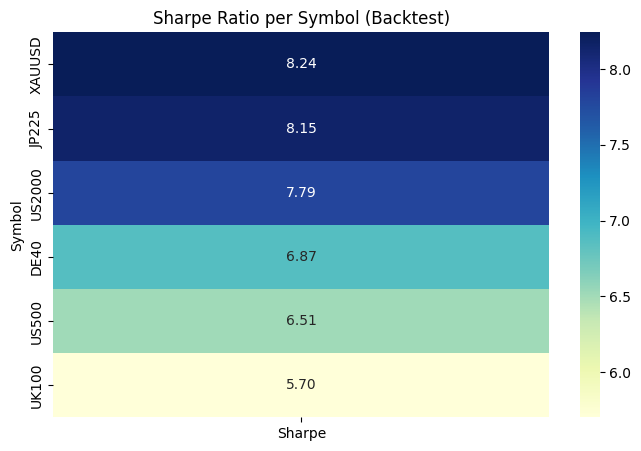

In [1]:
# ----------------------------------------------------------------------------
# 0) SETUP
# ----------------------------------------------------------------------------
import sys
import os
import warnings
from pathlib import Path

project_root = Path.cwd().parent.parent
sys.path.append(str(project_root))
os.chdir(str(project_root))
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import MetaTrader5 as mt5
import vectorbt as vbt
import joblib
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go

from data.data_loader_mt5 import get_data_mt5
from features.feature_engineering import add_all_ta_features
from features.labeling_schemes import create_labels_multi_bar

# ----------------------------------------------------------------------------
# 1) SYMBOLS TO BACKTEST
# ----------------------------------------------------------------------------
symbols = ["US500", "US2000", "UK100", "JP225", "XAUUSD", "DE40"]
timeframe = mt5.TIMEFRAME_H1
n_bars = 5000
start_pos = 0
horizon = 5
threshold = 0.005

model_folder = "models/h1_models"

# ----------------------------------------------------------------------------
# 2) BACKTESTING
# ----------------------------------------------------------------------------
if not mt5.initialize():
    raise RuntimeError("Failed to initialize MT5")

all_results = []

for symbol in symbols:
    print(f"\n\n🔵 Backtesting Symbol: {symbol}")

    model_path = f"{model_folder}/{symbol}_H1_best_model.pkl"
    if not os.path.exists(model_path):
        print(f"⚠️ Model not found for {symbol}, skipping...")
        continue

    # Load model + scaler
    loaded = joblib.load(model_path)
    model = loaded["model"]
    scaler = loaded["scaler"]

    # Fetch data
    data = get_data_mt5(symbol=symbol, timeframe=timeframe, n_bars=n_bars, start_pos=start_pos)
    if data is None or len(data) == 0:
        print(f"⚠️ No data for {symbol}, skipping...")
        continue

    df = add_all_ta_features(data)
    df_lbl = create_labels_multi_bar(df, horizon=horizon, threshold=threshold)

    X = df_lbl.drop(columns=["multi_bar_label", "future_return_h"])
    y = df_lbl["multi_bar_label"]

    X_scaled = scaler.transform(X)

    preds_shifted = model.predict(X_scaled)
    preds = preds_shifted - 1

    acc = (preds == y).mean()

    # Create signals
    close_prices = df_lbl["close"]
    signals = preds
    signals_s = pd.Series(signals, index=close_prices.index)

    pf = vbt.Portfolio.from_signals(
        close=close_prices,
        entries=signals_s > 0,
        exits=signals_s < 0,
        init_cash=10000,
        freq="4H",
        fees=0.0002
    )

    total_return = pf.total_return()
    sharpe = pf.sharpe_ratio()

    all_results.append({
        "Symbol": symbol,
        "Accuracy": acc,
        "Return(%)": total_return,
        "Sharpe": sharpe
    })

    # ----------------------------------------------------------------------------
    # 3) BACKTEST RESULTS
    # ----------------------------------------------------------------------------
    print("\n✅ Full Backtest Results:")
    print(f"Accuracy={acc:.2f}, Return={total_return:.2f}%, Sharpe={sharpe:.2f}")
    print(pf.stats())

    # Plot Portfolio Equity Curve
    pf.plot(title=f"Backtest: {symbol}").show()

    # ----------------------------------------------------------------------------
    # 4) ACTUAL vs PREDICTED PRICE PLOT
    # ----------------------------------------------------------------------------
    print("\n📈 Plotting Actual vs Predicted Close...")

    actual_close = close_prices.copy()

    pred_movement = preds
    predicted_close = actual_close.copy()

    for idx in range(len(predicted_close) - horizon):
        window = pred_movement[idx: idx + horizon]
        predicted_close.iloc[idx + horizon] = predicted_close.iloc[idx] * (1 + 0.001 * window.sum())

    predicted_close = predicted_close.shift(-horizon)

    fig = go.Figure()

    fig.add_trace(go.Scatter(
        x=actual_close.index,
        y=actual_close,
        mode='lines',
        name='Actual Close',
        line=dict(color='black')
    ))

    fig.add_trace(go.Scatter(
        x=predicted_close.index,
        y=predicted_close,
        mode='lines',
        name='Predicted Close',
        line=dict(color='orange')
    ))

    fig.update_layout(
        title=f"📈 Actual vs Predicted Close Price (horizon={horizon}) for {symbol}",
        xaxis_title="Date",
        yaxis_title="Price",
        template="plotly_white",
        legend=dict(x=0, y=1, bgcolor="rgba(255,255,255,0)", bordercolor="Black"),
        height=700
    )

    fig.show()

mt5.shutdown()

# ----------------------------------------------------------------------------
# 5) FINAL SUMMARY
# ----------------------------------------------------------------------------
results_df = pd.DataFrame(all_results)
results_df = results_df.sort_values(by="Sharpe", ascending=False)

print("\n\n✅ Final Backtest Results Summary:")
display(results_df.round(3))

# ----------------------------------------------------------------------------
# 6) HEATMAP
# ----------------------------------------------------------------------------

pivot_df = results_df.set_index("Symbol")[["Sharpe"]]  # <- fixed

plt.figure(figsize=(8, 5))
sns.heatmap(pivot_df, annot=True, fmt=".2f", cmap="YlGnBu")
plt.title("Sharpe Ratio per Symbol (Backtest)")
plt.show()



## Part 3: Model Training & Hyperparameter Tuning

**Objective:**  
Train an ML model (e.g., RandomForest, XGBoost) on the engineered features to predict the chosen labels.

**Tasks:**
- Perform time-based or walk-forward splits  
- Select top features if desired (e.g., using RandomForest feature importance)  
- Use `RandomizedSearchCV` or `GridSearchCV` to find optimal hyperparameters  
- Save the best model pipeline (e.g., `best_rf_pipeline.pkl`) 

In [1]:
# ----------------------------------------------------------------------------
# FINAL PRO VERSION: Multi-Symbol Model Optimization with Optuna + TimeSeriesSplit
# ----------------------------------------------------------------------------

import sys
import os
import warnings
from pathlib import Path

# ---------------------------------------------------------------------------
# 0) SETUP
# ---------------------------------------------------------------------------
project_root = Path.cwd().parent.parent
sys.path.append(str(project_root))
os.chdir(str(project_root))
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import MetaTrader5 as mt5
import joblib
import optuna

from data.data_loader_mt5 import get_data_mt5
from features.feature_engineering import add_all_ta_features
from features.labeling_schemes import create_labels_multi_bar
from sklearn.model_selection import TimeSeriesSplit
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score

# ----------------------------------------------------------------------------
# 1) CONFIGURATION
# ----------------------------------------------------------------------------
symbols = ["US30", "US500", "DE40", "JP225", "UK100", "XAUUSD"]
timeframe = mt5.TIMEFRAME_H4
n_bars = 10000
start_pos = 5000
horizon = 5
threshold = 0.005
folds = 3
trials = 50

save_folder = "models/rf_models"
os.makedirs(save_folder, exist_ok=True)

summary_rows = []

# ----------------------------------------------------------------------------
# 2) START MULTI-SYMBOL OPTIMIZATION
# ----------------------------------------------------------------------------
print("\n⚡ Starting MT5 connection...")
if not mt5.initialize():
    raise RuntimeError("❌ Failed to initialize MT5")

for symbol in symbols:
    print(f"\n\n🔵 Optimizing Symbol: {symbol}")

    # Fetch Data
    data = get_data_mt5(symbol=symbol, timeframe=timeframe, n_bars=n_bars, start_pos=start_pos)
    if data is None or len(data) < 1000:
        print(f"⚠️ Not enough data for {symbol}, skipping...")
        continue

    df = add_all_ta_features(data)
    df_lbl = create_labels_multi_bar(df, horizon=horizon, threshold=threshold)

    X = df_lbl.drop(columns=["multi_bar_label", "future_return_h"])
    y = df_lbl["multi_bar_label"]

    tscv = TimeSeriesSplit(n_splits=folds)

    # Define Optuna Objective
    def objective(trial):
        params = {
            "n_estimators": trial.suggest_int("n_estimators", 100, 1000, step=100),
            "max_depth": trial.suggest_int("max_depth", 5, 30),
            "min_samples_split": trial.suggest_int("min_samples_split", 2, 20),
            "max_features": trial.suggest_categorical("max_features", ["sqrt", "log2", 0.5, 0.8, None])
        }

        model = Pipeline([
            ("scaler", StandardScaler()),
            ("rf", RandomForestClassifier(**params, random_state=42))
        ])

        scores = []
        for train_idx, test_idx in tscv.split(X):
            X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
            y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

            model.fit(X_train, y_train + 1)
            preds = model.predict(X_test)
            scores.append(accuracy_score(y_test + 1, preds))

        return np.mean(scores)

    # Run Optuna
    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=trials)

    print(f"✅ Best Params for {symbol}: {study.best_params}")

    # Retrain best model
    best_params = study.best_params

    best_model = Pipeline([
        ("scaler", StandardScaler()),
        ("rf", RandomForestClassifier(
            n_estimators=best_params["n_estimators"],
            max_depth=best_params["max_depth"],
            min_samples_split=best_params["min_samples_split"],
            max_features=best_params["max_features"],
            random_state=42
        ))
    ])

    best_model.fit(X, y + 1)

    # Save model
    model_path = os.path.join(save_folder, f"{symbol}_best_model.pkl")
    joblib.dump(best_model, model_path)

    print(f"💾 Saved best model for {symbol} to {model_path}")

    # Save best performance in summary
    summary_rows.append({
        "Symbol": symbol,
        "BestParams": study.best_params,
        "BestAccuracy": study.best_value
    })

mt5.shutdown()
print("\n✅ All symbols optimized. MT5 connection closed.")

# ----------------------------------------------------------------------------
# 3) SAVE SUMMARY TABLE
# ----------------------------------------------------------------------------
summary_df = pd.DataFrame(summary_rows)
summary_path = os.path.join(save_folder, "summary_results.csv")
summary_df.to_csv(summary_path, index=False)

print(f"\n📄 Saved optimization summary to {summary_path}")
print(summary_df)



⚡ Starting MT5 connection...


🔵 Optimizing Symbol: US30


[I 2025-04-20 20:03:10,194] A new study created in memory with name: no-name-725b04f3-aa18-4218-999d-7915391bbee9
[I 2025-04-20 20:05:11,447] Trial 0 finished with value: 0.4966639978649587 and parameters: {'n_estimators': 700, 'max_depth': 11, 'min_samples_split': 11, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.4966639978649587.
[I 2025-04-20 20:27:57,500] Trial 1 finished with value: 0.33626901521216973 and parameters: {'n_estimators': 500, 'max_depth': 22, 'min_samples_split': 12, 'max_features': None}. Best is trial 0 with value: 0.4966639978649587.
[I 2025-04-20 20:30:29,470] Trial 2 finished with value: 0.4683746997598078 and parameters: {'n_estimators': 700, 'max_depth': 27, 'min_samples_split': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.4966639978649587.
[I 2025-04-20 20:32:43,239] Trial 3 finished with value: 0.4707766212970377 and parameters: {'n_estimators': 600, 'max_depth': 28, 'min_samples_split': 9, 'max_features': 'sqrt'}. Best is trial 0 with 

✅ Best Params for US30: {'n_estimators': 200, 'max_depth': 5, 'min_samples_split': 15, 'max_features': 'log2'}
💾 Saved best model for US30 to models/rf_models\US30_best_model.pkl


🔵 Optimizing Symbol: US500


[I 2025-04-21 00:00:22,288] A new study created in memory with name: no-name-1e63308f-4a9a-46d6-8cd1-c64b6cde87a7
[I 2025-04-21 00:01:37,208] Trial 0 finished with value: 0.4324793167867627 and parameters: {'n_estimators': 400, 'max_depth': 23, 'min_samples_split': 14, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.4324793167867627.
[I 2025-04-21 00:30:08,876] Trial 1 finished with value: 0.3564184681078196 and parameters: {'n_estimators': 1000, 'max_depth': 14, 'min_samples_split': 10, 'max_features': None}. Best is trial 0 with value: 0.4324793167867627.
[I 2025-04-21 00:33:53,872] Trial 2 finished with value: 0.3576194288764345 and parameters: {'n_estimators': 200, 'max_depth': 26, 'min_samples_split': 5, 'max_features': 0.5}. Best is trial 0 with value: 0.4324793167867627.
[I 2025-04-21 00:44:00,634] Trial 3 finished with value: 0.47838270616493195 and parameters: {'n_estimators': 900, 'max_depth': 9, 'min_samples_split': 6, 'max_features': 0.5}. Best is trial 3 with value:

✅ Best Params for US500: {'n_estimators': 800, 'max_depth': 5, 'min_samples_split': 15, 'max_features': 'log2'}
💾 Saved best model for US500 to models/rf_models\US500_best_model.pkl


🔵 Optimizing Symbol: DE40


[I 2025-04-21 02:58:08,014] A new study created in memory with name: no-name-44a35965-984f-4d7a-865d-60e3d04cb312
[I 2025-04-21 02:58:21,529] Trial 0 finished with value: 0.3151344841429145 and parameters: {'n_estimators': 100, 'max_depth': 13, 'min_samples_split': 16, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.3151344841429145.
[I 2025-04-21 02:59:14,799] Trial 1 finished with value: 0.32195905258932156 and parameters: {'n_estimators': 500, 'max_depth': 24, 'min_samples_split': 6, 'max_features': 'log2'}. Best is trial 1 with value: 0.32195905258932156.
[I 2025-04-21 03:05:55,202] Trial 2 finished with value: 0.2965341897497658 and parameters: {'n_estimators': 300, 'max_depth': 15, 'min_samples_split': 11, 'max_features': None}. Best is trial 1 with value: 0.32195905258932156.
[I 2025-04-21 03:09:32,661] Trial 3 finished with value: 0.37414692894419915 and parameters: {'n_estimators': 300, 'max_depth': 6, 'min_samples_split': 6, 'max_features': None}. Best is trial 3 with 

✅ Best Params for DE40: {'n_estimators': 800, 'max_depth': 5, 'min_samples_split': 18, 'max_features': 'log2'}
💾 Saved best model for DE40 to models/rf_models\DE40_best_model.pkl


🔵 Optimizing Symbol: JP225


[I 2025-04-21 06:31:25,383] A new study created in memory with name: no-name-163d554e-5fad-4959-9afd-fd0dae7ec105
[I 2025-04-21 06:34:32,354] Trial 0 finished with value: 0.34414198025086734 and parameters: {'n_estimators': 300, 'max_depth': 7, 'min_samples_split': 20, 'max_features': 0.8}. Best is trial 0 with value: 0.34414198025086734.
[I 2025-04-21 06:35:16,824] Trial 1 finished with value: 0.32412596744061917 and parameters: {'n_estimators': 300, 'max_depth': 16, 'min_samples_split': 19, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.34414198025086734.
[I 2025-04-21 06:39:15,076] Trial 2 finished with value: 0.3142514011208967 and parameters: {'n_estimators': 200, 'max_depth': 26, 'min_samples_split': 18, 'max_features': 0.8}. Best is trial 0 with value: 0.34414198025086734.
[I 2025-04-21 06:44:06,906] Trial 3 finished with value: 0.3121163597544703 and parameters: {'n_estimators': 400, 'max_depth': 23, 'min_samples_split': 20, 'max_features': 0.5}. Best is trial 0 with va

✅ Best Params for JP225: {'n_estimators': 1000, 'max_depth': 5, 'min_samples_split': 12, 'max_features': 'log2'}
💾 Saved best model for JP225 to models/rf_models\JP225_best_model.pkl


🔵 Optimizing Symbol: UK100


[I 2025-04-21 11:39:21,953] A new study created in memory with name: no-name-f6502bb0-70e9-41e8-85cf-08ecf4401174
[I 2025-04-21 11:41:47,988] Trial 0 finished with value: 0.4531502423263327 and parameters: {'n_estimators': 600, 'max_depth': 25, 'min_samples_split': 13, 'max_features': 'log2'}. Best is trial 0 with value: 0.4531502423263327.
[I 2025-04-21 11:44:23,487] Trial 1 finished with value: 0.46607431340872374 and parameters: {'n_estimators': 800, 'max_depth': 7, 'min_samples_split': 10, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.46607431340872374.
[I 2025-04-21 11:51:44,936] Trial 2 finished with value: 0.4254173397953689 and parameters: {'n_estimators': 200, 'max_depth': 12, 'min_samples_split': 4, 'max_features': 0.8}. Best is trial 1 with value: 0.46607431340872374.
[I 2025-04-21 11:55:55,942] Trial 3 finished with value: 0.44803446418955306 and parameters: {'n_estimators': 700, 'max_depth': 23, 'min_samples_split': 10, 'max_features': 'sqrt'}. Best is trial 1 wit

✅ Best Params for UK100: {'n_estimators': 900, 'max_depth': 5, 'min_samples_split': 19, 'max_features': 0.5}
💾 Saved best model for UK100 to models/rf_models\UK100_best_model.pkl


🔵 Optimizing Symbol: XAUUSD


[I 2025-04-21 23:16:53,783] A new study created in memory with name: no-name-ff9e7233-2643-4a14-8e74-706391003f43
[I 2025-04-21 23:17:23,187] Trial 0 finished with value: 0.37950360288230583 and parameters: {'n_estimators': 100, 'max_depth': 24, 'min_samples_split': 17, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.37950360288230583.
[I 2025-04-21 23:52:04,209] Trial 1 finished with value: 0.4551641313050441 and parameters: {'n_estimators': 1000, 'max_depth': 19, 'min_samples_split': 20, 'max_features': 0.8}. Best is trial 1 with value: 0.4551641313050441.
[I 2025-04-21 23:53:05,934] Trial 2 finished with value: 0.39738457432612756 and parameters: {'n_estimators': 400, 'max_depth': 17, 'min_samples_split': 5, 'max_features': 'log2'}. Best is trial 1 with value: 0.4551641313050441.
[I 2025-04-21 23:53:51,510] Trial 3 finished with value: 0.40872698158526816 and parameters: {'n_estimators': 200, 'max_depth': 19, 'min_samples_split': 3, 'max_features': 'sqrt'}. Best is trial 1 wi

✅ Best Params for XAUUSD: {'n_estimators': 800, 'max_depth': 5, 'min_samples_split': 10, 'max_features': None}
💾 Saved best model for XAUUSD to models/rf_models\XAUUSD_best_model.pkl

✅ All symbols optimized. MT5 connection closed.

📄 Saved optimization summary to models/rf_models\summary_results.csv
   Symbol                                         BestParams  BestAccuracy
0    US30  {'n_estimators': 200, 'max_depth': 5, 'min_sam...      0.580998
1   US500  {'n_estimators': 800, 'max_depth': 5, 'min_sam...      0.570857
2    DE40  {'n_estimators': 800, 'max_depth': 5, 'min_sam...      0.520541
3   JP225  {'n_estimators': 1000, 'max_depth': 5, 'min_sa...      0.408727
4   UK100  {'n_estimators': 900, 'max_depth': 5, 'min_sam...      0.532714
5  XAUUSD  {'n_estimators': 800, 'max_depth': 5, 'min_sam...      0.560448
